# Test modules

In [1]:
from bokeh.models import CustomJS, ColumnDataSource, Slider, TextInput, ColorPicker, MultiSelect, BoxSelectTool, CheckboxGroup
from bokeh.plotting import figure, output_notebook, show
from bokeh.layouts import row, column
import numpy as np

output_notebook()

x = np.linspace(0, 10, 500)
y1 = np.sin(x)
y2 = np.cos(x)

source = ColumnDataSource(data=dict(x=x, y1=y1, y2=y2))

plot = figure(width=640, height=480, x_range=(0, 10), y_range=(-10, 10))

line1 = plot.line('x', 'y1', source=source, line_width=5, line_alpha=1, legend_label="Sin")
line2 = plot.line('x', 'y2', source=source, line_width=5, line_alpha=1, legend_label="Cos")

plot.xaxis.ticker = []
plot.xaxis.axis_line_width = 4
plot.xaxis.axis_line_color = "black"
plot.xaxis.axis_label_text_font_size = '24px'
plot.xaxis.major_label_orientation = 1.7

plot.yaxis.ticker = []
plot.yaxis.axis_line_width = 4
plot.yaxis.axis_line_color = "black"
plot.yaxis.axis_label_text_font_size = '24px'

plot.xaxis.axis_label = r"\[x\]"
plot.yaxis.axis_label = r"\[y\]"
plot.yaxis.major_label_orientation = 'vertical'

plot.legend.location = "top_right"
plot.legend.click_policy="hide"

amp_slider = Slider(start=0.1, end=10, value=1, step=.1, title="Amplitude")
freq_slider = Slider(start=0.1, end=10, value=1, step=.1, title="Frequency")
phase_slider = Slider(start=0, end=6.4, value=0, step=.1, title="Phase")
offset_slider = Slider(start=-5, end=5, value=0, step=.1, title="Offset")

picker1 = ColorPicker(title="Sin color", width_policy="min")
picker2 = ColorPicker(title="Cos color", width_policy="min")

callback = CustomJS(args=dict(source=source, amp=amp_slider, freq=freq_slider, phase=phase_slider, offset=offset_slider),
                    code="""
    const data = source.data;

    const x = data['x'];
    const y1 = data['y1'];
    const y2 = data['y2'];
    
    const A = amp.value;
    const k = freq.value;
    const phi = phase.value;
    const B = offset.value;
    
    for (let i = 0; i < x.length; i++) {
        y1[i] = B + A*Math.sin(k*x[i]+phi);
        y2[i] = B + A*Math.cos(k*x[i]+phi);
    }
    source.change.emit();
""")

amp_slider.js_on_change('value', callback)
freq_slider.js_on_change('value', callback)
phase_slider.js_on_change('value', callback)
offset_slider.js_on_change('value', callback)
picker1.js_link('color', line1.glyph, 'line_color')
picker2.js_link('color', line2.glyph, 'line_color')

layout = row(plot, column(amp_slider, freq_slider, phase_slider, offset_slider, row(picker1, picker2)))
# layout = column(plot, amp_slider, freq_slider, phase_slider, offset_slider)

show(layout)

Loading BokehJS ...

In [2]:
import altair as alt
from vega_datasets import data

source = data.population.url

pink_blue = alt.Scale(domain=('Male', 'Female'),
                      range=["steelblue", "salmon"])

slider = alt.binding_range(min=1900, max=2000, step=10)
select_year = alt.selection_single(name="year", fields=['year'],
                                   bind=slider, init={'year': 2000})

alt.Chart(source).mark_bar().encode(
    x=alt.X('sex:N', title=None),
    y=alt.Y('people:Q', scale=alt.Scale(domain=(0, 12000000))),
    color=alt.Color('sex:N', scale=pink_blue),
    column='age:O'
).properties(
    width=20
).add_selection(
    select_year
).transform_calculate(
    "sex", alt.expr.if_(alt.datum.sex == 1, "Male", "Female")
).transform_filter(
    select_year
).configure_facet(
    spacing=8
)

alt.Chart(...)

In [3]:
import plotly.figure_factory as ff

import numpy as np
from scipy.spatial import Delaunay

u = np.linspace(0, 2*np.pi, 20)
v = np.linspace(0, 2*np.pi, 20)
u,v = np.meshgrid(u,v)
u = u.flatten()
v = v.flatten()

x = (3 + (np.cos(v)))*np.cos(u)
y = (3 + (np.cos(v)))*np.sin(u)
z = np.sin(v)

points2D = np.vstack([u,v]).T
tri = Delaunay(points2D)
simplices = tri.simplices

fig = ff.create_trisurf(x=x, y=y, z=z,
                         simplices=simplices,
                         title="Torus", aspectratio=dict(x=1, y=1, z=0.3))
fig.show()

In [4]:
from bokeh.layouts import column
from bokeh.models import ColumnDataSource, CustomJS, Slider, Label
from bokeh.plotting import figure, output_notebook, show
import numpy as np

output_notebook()

t = [t*0.005 for t in range(0, 10000)]
x = [1 * np.sin(3*t + 1)  for t in t]
y = [1 * np.sin(4*t)  for t in t]

source = ColumnDataSource(data=dict(t=t, x=x, y=y))

plot = figure(width=400, height=400)
plot.line('x', 'y', source=source, line_width=3, line_alpha=0.6)

A_slider = Slider(start=0.1, end=10, value=1, step=.1, title="A")
B_slider = Slider(start=0.1, end=10, value=1, step=.1, title="B")
a_slider = Slider(start=0.1, end=10, value=3, step=.1, title="a")
b_slider = Slider(start=0.1, end=10, value=4, step=.1, title="b")
delta_slider = Slider(start=0.1, end=10, value=np.pi/2, step=.1, title="delta")

callback = CustomJS(args=dict(source=source, A1=A_slider, B1=B_slider, a1=a_slider, b1=b_slider, delta1=delta_slider), code="""
        
        const A = A1.value;
        const B = B1.value;
        const a = a1.value;
        const b = b1.value;
        const delta = delta1.value;
        const data = source.data;
        
        const t = data['t']
        const x = data['x']
        const y = data['y']
        
        for (let i = 0; i < t.length; i++) {
            x[i] = A*Math.sin(a*t[i] + delta)
            y[i] = B*Math.sin(b*t[i])
        }
        source.change.emit();
    """)

A_slider.js_on_change('value', callback)
B_slider.js_on_change('value', callback)
a_slider.js_on_change('value', callback)
b_slider.js_on_change('value', callback)
delta_slider.js_on_change('value', callback)



# layout = column(slider, plot)
layout = row(plot, column(A_slider, B_slider, a_slider, b_slider, delta_slider))
# print(type(callback.code))
# print(source.data)

show(layout)

Loading BokehJS ...

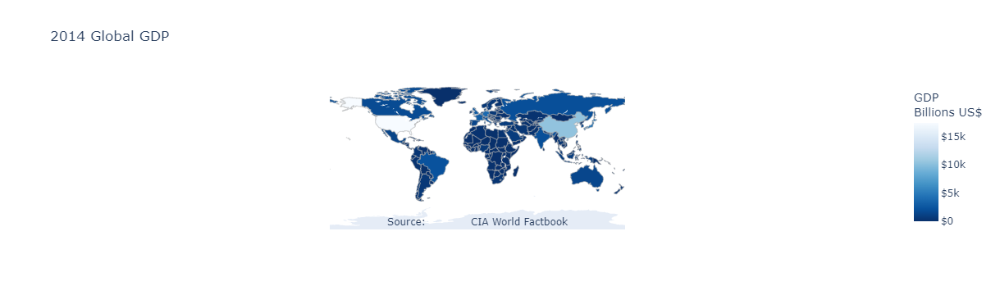

In [5]:
import plotly.graph_objects as go
import pandas as pd
import plotly

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv')

fig = go.Figure(data=go.Choropleth(
    locations = df['CODE'],
    z = df['GDP (BILLIONS)'],
    text = df['COUNTRY'],
    colorscale = 'Blues',
    autocolorscale=False,
    reversescale=True,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_tickprefix = '$',
    colorbar_title = 'GDP<br>Billions US$',
))

fig.update_layout(
    title_text='2014 Global GDP',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    ),
    annotations = [dict(
        x=0.5,
        y=0,    #Trying a negative number makes the caption disappear - I'd like the caption to be below the map
        xref='paper',
        yref='paper',
        text='Source: <a href="https://www.cia.gov/library/publications/the-world-factbook/fields/2195.html">\
            CIA World Factbook</a>',
        showarrow = False
    )]
)

fig.show()


In [6]:
import plotly.graph_objects as go
import pandas as pd
import plotly

def annot(xcrd, zcrd, txt, xancr='center'):
    strng=dict(showarrow=False, x=xcrd, y=0, z=zcrd, text=txt, xanchor=xancr, font=dict(color='white',size=12))
    return strng

def orbits(dist, offset=0, clr='white', wdth=2): 
    
    # Initialize empty lists for each set of coordinates
    xcrd=[]
    ycrd=[]
    zcrd=[]
    
    # Calculate coordinates
    for i in range(0,361):
        xcrd=xcrd+[(round(np.cos(np.radians(i)),5)) * dist + offset]
        ycrd=ycrd+[(round(np.sin(np.radians(i)),5)) * dist]
        zcrd=zcrd+[0]
    
    trace = go.Scatter3d(x=xcrd, y=ycrd, z=zcrd, marker=dict(size=0.1), line=dict(color=clr,width=wdth))
    return trace

def spheres(size, clr, dist=0): 
    
    # Set up 100 points. First, do angles
    theta = np.linspace(0,2*np.pi,100)
    phi = np.linspace(0,np.pi,100)
    
    # Set up coordinates for points on the sphere
    x0 = dist + size * np.outer(np.cos(theta),np.sin(phi))
    y0 = size * np.outer(np.sin(theta),np.sin(phi))
    z0 = size * np.outer(np.ones(100),np.cos(phi))
    
    # Set up trace
    trace= go.Surface(x=x0, y=y0, z=z0, colorscale=[[0,clr], [1,clr]])
    trace.update(showscale=False)

    return trace

# Note, true diameter of the Sun is 1,392,700km. Reduced it for better visualization
diameter_km = [200000, 4878, 12104, 12756, 6787, 142796, 120660, 51118, 48600]
# Modify planet sizes making them retative to the Earth size, where Earth in this case = 2
diameter = [((i / 12756) * 2) for i in diameter_km]
# Distance from the sun expressed in millions of km
distance_from_sun = [0, 57.9, 108.2, 149.6, 227.9, 778.6, 1433.5, 2872.5, 4495.1]

# Create spheres for the Sun and planets
trace0=spheres(diameter[0], '#ffff00', distance_from_sun[0]) # Sun
trace1=spheres(diameter[1], '#87877d', distance_from_sun[1]) # Mercury
trace2=spheres(diameter[2], '#d23100', distance_from_sun[2]) # Venus
trace3=spheres(diameter[3], '#325bff', distance_from_sun[3]) # Earth
trace4=spheres(diameter[4], '#b20000', distance_from_sun[4]) # Mars
trace5=spheres(diameter[5], '#ebebd2', distance_from_sun[5]) # Jupyter
trace6=spheres(diameter[6], '#ebcd82', distance_from_sun[6]) # Saturn
trace7=spheres(diameter[7], '#37ffda', distance_from_sun[7]) # Uranus
trace8=spheres(diameter[8], '#2500ab', distance_from_sun[8]) # Neptune

# Set up orbit traces
trace11 = orbits(distance_from_sun[1]) # Mercury
trace12 = orbits(distance_from_sun[2]) # Venus
trace13 = orbits(distance_from_sun[3]) # Earth
trace14 = orbits(distance_from_sun[4]) # Mars
trace15 = orbits(distance_from_sun[5]) # Jupyter
trace16 = orbits(distance_from_sun[6]) # Saturn
trace17 = orbits(distance_from_sun[7]) # Uranus
trace18 = orbits(distance_from_sun[8]) # Neptune

# Use the same to draw a few rings for Saturn
trace21 = orbits(23, distance_from_sun[6], '#827962', 3) 
trace22 = orbits(24, distance_from_sun[6], '#827962', 3) 
trace23 = orbits(25, distance_from_sun[6], '#827962', 3)
trace24 = orbits(26, distance_from_sun[6], '#827962', 3) 
trace25 = orbits(27, distance_from_sun[6], '#827962', 3) 
trace26 = orbits(28, distance_from_sun[6], '#827962', 3)

layout=go.Layout(title = 'Solar System', showlegend=False, margin=dict(l=0, r=0, t=0, b=0),
                  #paper_bgcolor = 'black',
                  scene = dict(xaxis=dict(title='Distance from the Sun', 
                                          titlefont_color='black', 
                                          range=[-7000,7000], 
                                          backgroundcolor='black',
                                          color='black',
                                          gridcolor='black'),
                               yaxis=dict(title='Distance from the Sun',
                                          titlefont_color='black',
                                          range=[-7000,7000],
                                          backgroundcolor='black',
                                          color='black',
                                          gridcolor='black'
                                          ),
                               zaxis=dict(title='', 
                                          range=[-7000,7000],
                                          backgroundcolor='black',
                                          color='white', 
                                          gridcolor='black'
                                         ),
                               annotations=[
                                   annot(distance_from_sun[0], 40, 'Sun', xancr='left'),
                                   annot(distance_from_sun[1], 5, 'Mercury'),
                                   annot(distance_from_sun[2], 9, 'Venus'),
                                   annot(distance_from_sun[3], 9, 'Earth'),
                                   annot(distance_from_sun[4], 7, 'Mars'),
                                   annot(distance_from_sun[5], 30, 'Jupyter'),
                                   annot(distance_from_sun[6], 28, 'Saturn'),
                                   annot(distance_from_sun[7], 20, 'Uranus'),
                                   annot(distance_from_sun[8], 20, 'Neptune'),
                                   ]
                               ))

fig = go.Figure(data = [trace0, trace1, trace2, trace3, trace4, trace5, trace6, trace7, trace8,
                        trace11, trace12, trace13, trace14, trace15, trace16, trace17, trace18,
                        trace21, trace22, trace23, trace24, trace25, trace26],
                layout = layout)

fig.show()

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import ipyvolume as ipv

x, y, z = np.random.random((3, 1000))

fig = ipv.figure()

ipv.quickscatter(x, y, z, size=1, marker="sphere")
ipv.style.use("dark") # looks better
ipv.show()

In [8]:
import ipyvolume as ipv
import numpy as np
x, y, z, u, v, w = np.random.random((6, 1000))*2-1
selected = np.random.randint(0, 1000, 100)
ipv.figure()
quiver = ipv.quiver(x, y, z, u, v, w, size=5)

x, y, z, u, v, w = np.random.random((6, 1000))*2
quiver2 = ipv.quiver(x, y, z, u, v, w, size=5)

from ipywidgets import FloatSlider, ColorPicker, VBox, jslink
size = FloatSlider(min=0, max=30, step=0.1)
size2 = FloatSlider(min=0, max=30, step=0.1)
size_selected = FloatSlider(min=0, max=30, step=0.1)
color = ColorPicker()
color_selected = ColorPicker()
jslink((quiver, 'size'), (size, 'value'))
jslink((quiver2, 'size'), (size2, 'value'))
# jslink((quiver, 'size_selected'), (size_selected, 'value'))
jslink((quiver, 'color'), (color, 'value'))
jslink((quiver, 'color_selected'), (color_selected, 'value'))
VBox([ipv.gcc(), size, size2, color, color_selected])

In [20]:
from bokeh.io import output_notebook, show
from bokeh.plotting import figure
from bokeh.models import CustomJS, ColumnDataSource
import ipyvolume.bokeh
output_notebook()

x, y, z, u, v, w = np.random.random((6, 1000))*2-1
quiver = ipv.quiver(x, y, z, u, v, w, size=5)
data_source = ColumnDataSource(data=dict(x=x, y=y))

ipv.figure()

# p = figure(title="E Lz space", tools='lasso_select', width=500, height=500)
r = p.circle('x', 'y', source=data_source, color="navy", alpha=0.2)
ipyvolume.bokeh.link_data_source_selection_to_widget(data_source, quiver, 'size')

from ipywidgets import FloatSlider, ColorPicker, VBox, jslink
size = FloatSlider(min=0, max=30, step=0.1)

jslink((quiver, 'size'), (size, 'value'))

VBox([ipv.gcc(), size])

show(p)



Loading BokehJS ...